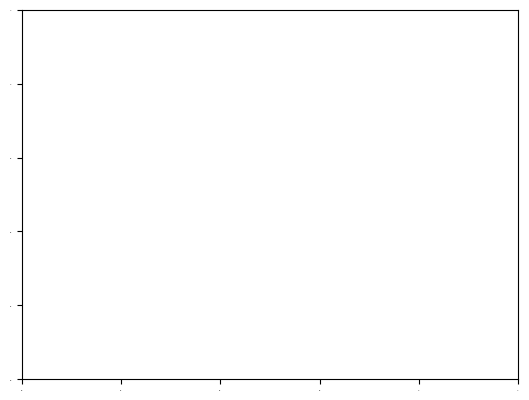

In [23]:
import os
import pandas as pd
import numpy as np
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
import rasterio
from rasterio.plot import show
from rasterio.warp import transform
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from pathlib import Path
from matplotlib.ticker import ScalarFormatter
from os.path import join
from shapely.geometry import box
import warnings
from shapely.ops import unary_union
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt
from rasterio.vrt import WarpedVRT
from rasterio.enums import Resampling

fontsize = 14
# plt.rcParams['font.family'] = 'serif'
plt.rcParams['xtick.labelsize'] = fontsize + 2
plt.rcParams['ytick.labelsize'] = fontsize + 2
plt.rcParams['font.size'] = fontsize
plt.rcParams['legend.fontsize'] = fontsize
plt.tick_params(axis='both', labelsize=1)

In [24]:
manual_label_dir = "/net/data_ssd/tree_mortality_orthophotos/labels_and_aois/"
orthophoto_dir = "/net/data_ssd/tree_mortality_orthophotos/orthophotos/"
prediction_label_dir = "/net/data_ssd/tree_mortality_orthophotos/deadwood_segmentation_predictions_104//"

TP_area=1636.3965624261136, FP_area=321.8042206201513, FN_area=26.160117209265444
basename='auwald_flight_all_merge_ortho', precision=0.8356633173644542, recall=0.9842651276015427, f1=0.9038973636274151
TP_area=101.89748108250156, FP_area=60.73243356620726, FN_area=20.01280013171111
basename='quebec_2021-07-21-sbl-cloutier-z1-rgb', precision=0.6265605027378065, recall=0.835839931362754, f1=0.7162255636570316
TP_area=11.697335697139872, FP_area=57.85070317803117, FN_area=0.6133789739064299
basename='quebec_2021-06-17-sbl-cloutier-z2-rgb', precision=0.16819073386289074, recall=0.950175193699433, f1=0.28579315443730946
TP_area=0.0, FP_area=28.554553528087983, FN_area=0.0
basename='switzerlandeth_rgb11', precision=0.0, recall=0, f1=0
TP_area=326.1479939268786, FP_area=91.60498045009498, FN_area=5.515033165445446
basename='spain_20_09_2023_south_tejeda_1_ortho', precision=0.7807197409265311, recall=0.9833715768266499, f1=0.8704057380345124
TP_area=115.0787003924525, FP_area=79.1333795396392

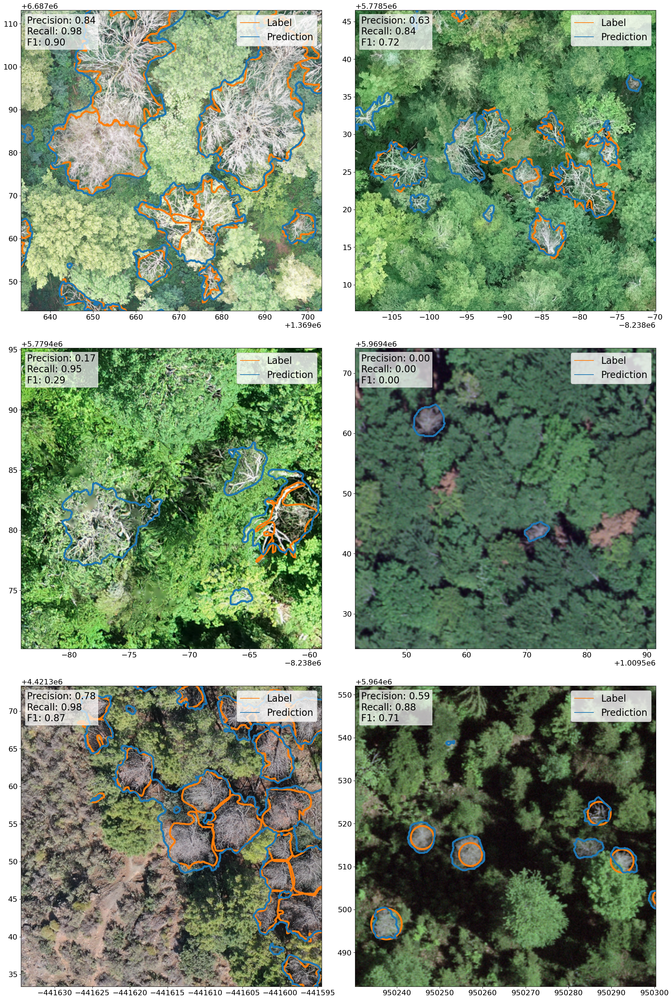

In [37]:
orthophoto_base_names = ["auwald_flight_all_merge_ortho", "quebec_2021-07-21-sbl-cloutier-z1-rgb", "quebec_2021-06-17-sbl-cloutier-z2-rgb",
                        "switzerlandeth_rgb11", "spain_20_09_2023_south_tejeda_1_ortho", "switzerlandeth_rgb9", ]
bls = [(51.37021264, 12.30362458), (45.9885, -74.0042), (45.99451412, -74.00396778), (47.1672977, 9.0688653), (36.87238192, -3.96727006), (47.13710621, 8.53606414), ] 
# extents = [0.00068366, 0.0004, 0.00025, 0.0005, 0.0004, 0.0007]
extents = [70, 40, 25, 50, 40, 70]

# "uavforsat_FIN003_ortho" (60.223928052, 24.910386108), 0.0005
# "uavforsat_FIN003_ortho", (60.2232, 24.914030093), 0.00068366,

fig, axes = plt.subplots(ncols=2, nrows=3 ,figsize=(20,30))

plot_crs = "EPSG:3857"

for basename, bl, extent, ax in zip(orthophoto_base_names, bls, extents, axes.flatten()):
    label_path = join(manual_label_dir, basename + "_polygons.gpkg")
    orthophoto_path = join(orthophoto_dir, basename + ".tif")
    prediction_path = join(prediction_label_dir, basename + "_prediction.gpkg")
    
    with rasterio.open(orthophoto_path) as dr:
        with WarpedVRT(dr, crs=plot_crs, resampling=Resampling.bilinear) as vrt:

            label = gpd.read_file(label_path, layer="standing_deadwood")
            try:
                label = pd.concat([label, gpd.read_file(label_path, layer="brown_trees")])
            except:
                pass
            try:
                label = pd.concat([label, gpd.read_file(label_path, layer="parts")])
            except:
                pass
                
            label = label.to_crs(plot_crs).buffer(0)
            prediction = gpd.read_file(prediction_path).to_crs(plot_crs).buffer(0)

            blt = transform("EPSG:4326", plot_crs, [bl[1]], [bl[0]])

            # reproject bounds box dr.crs to plot_crs
            # bounds_box = transform_bounds(dr.crs, plot_crs, *bounds_box.bounds)
            bounds_box = (blt[0][0], blt[1][0], blt[0][0] + extent, blt[1][0] + extent)

            ax.set_xlim((bounds_box[0], bounds_box[2]))
            ax.set_ylim((bounds_box[1], bounds_box[3]))
            
            win = vrt.window(*bounds_box) 
            ax.imshow(np.moveaxis(vrt.read(window=win), 0, -1), extent=[bounds_box[0], bounds_box[2], bounds_box[1], bounds_box[3]], vmin=0, vmax=255)
            
            label.boundary.plot(ax=ax, color="#ff7f0e", lw=4, alpha=1)
            prediction.boundary.plot(ax=ax, color="#1f77b4", lw=4, alpha=1)

            bounds_box_box = box(*bounds_box)
        
            with warnings.catch_warnings():
                warnings.simplefilter("ignore")
                # crop label and prediction to extend of image and unionize 
                label_union = label.union_all().intersection(bounds_box_box) 
                pred_union = prediction.union_all().intersection(bounds_box_box)
                TP_area = label_union.intersection(pred_union).area
                FP_area = pred_union.difference(label_union).area 
                FN_area = label_union.difference(pred_union).area
                
            print(f"{TP_area=}, {FP_area=}, {FN_area=}")
        
            if TP_area + FP_area == 0:
                precision = 0
            else:
                precision = TP_area / (TP_area + FP_area)
        
            if TP_area + FN_area == 0:
                recall = 0
            else:
                recall = TP_area / (TP_area + FN_area)
        
            if precision + recall == 0:
                f1 = 0
            else:
                f1 = 2 * (precision * recall) / (precision + recall)
        
            print(f"{basename=}, {precision=}, {recall=}, {f1=}")
        
            
            legend_elements = [Line2D([0], [0], color="#ff7f0e", label='Label'),
                             Line2D([0], [0], color="#1f77b4", label='Prediction')]
            ax.legend(handles=legend_elements, fontsize=20)
        
            ax.set_aspect("equal")
        
            stats_text = f'Precision: {precision:.2f}\nRecall: {recall:.2f}\nF1: {f1:.2f}'
            ax.text(bounds_box[0] + 0.02*extent, bounds_box[1] + 0.98*extent, stats_text, 
                   bbox=dict(facecolor='white', alpha=0.7, edgecolor="white"),
                   verticalalignment='top', fontsize=20)

    
fig.subplots_adjust(hspace=0.1, wspace=0.1)
fig.tight_layout()
fig.savefig("/net/home/cmosig/projects/standing-deadwood/plots/discussion_plot_examples.pdf", bbox_inches="tight")